In [5]:
import open3d as o3d
import pandas as pd
import numpy as np
import time
import plotly.graph_objects as go
from IPython.display import display, clear_output

# Load PCD file (Assuming it contains time series data in XYZ format)
pcd = o3d.io.read_point_cloud("./cube_data/sensor_1/1.pcd")
points = np.asarray(pcd.points)  # Convert to numpy array

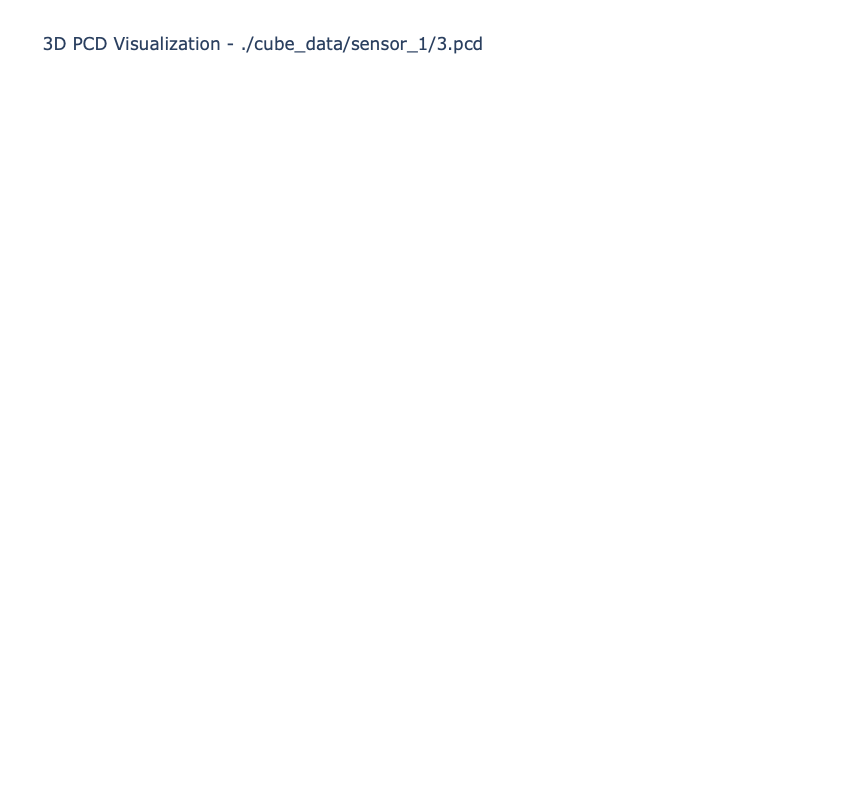

All PCD files have been visualized!


In [11]:
import open3d as o3d
import numpy as np
import time
import plotly.graph_objects as go
import os
from IPython.display import display, clear_output

# Path to folder containing PCD files
pcd_folder = "./cube_data/sensor_1"  # Replace with your actual folder path

# Get list of all PCD files in the folder
pcd_files = sorted([f for f in os.listdir(pcd_folder) if f.endswith(".pcd")])  # Sort for proper sequence

# Loop through PCD files sequentially
for file_name in pcd_files:
    clear_output(wait=True)  # Clears previous frame output in Jupyter
    
    file_path = os.path.join(pcd_folder, file_name)
    pcd = o3d.io.read_point_cloud(file_path)  # Load the PCD file
    points = np.asarray(pcd.points)  # Convert to NumPy array

    # Create 3D scatter plot
    fig = go.Figure(data=[go.Scatter3d(
        x=points[:, 0], 
        y=points[:, 1], 
        z=points[:, 2],
        mode='markers',
        marker=dict(size=2, color=points[:, 2], colorscale='Viridis', opacity=0.8)
    )])

    fig.update_layout(
        title=f"3D PCD Visualization - {pcd_folder}/{file_name}",  # Set title as the filename
        width=800,
        height=800,
        scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z')
    )

    display(fig)  # Show the updated figure
    time.sleep(0.5)  # Adjust delay as needed

print("All PCD files have been visualized!")

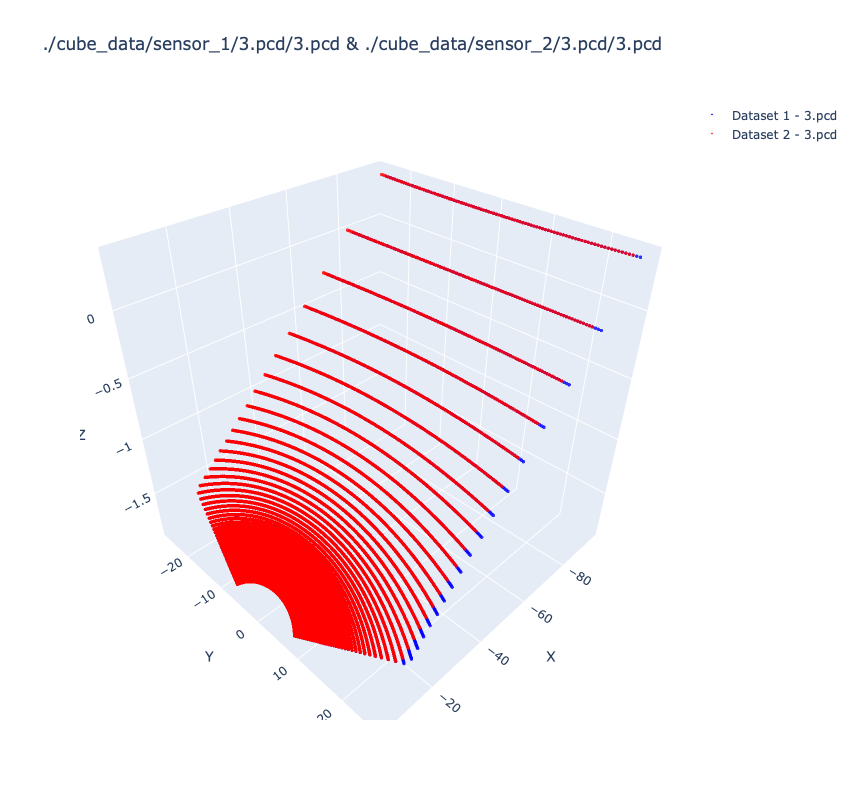

All PCD files have been visualized!


In [14]:
import open3d as o3d
import numpy as np
import time
import plotly.graph_objects as go
import os
from IPython.display import display, clear_output

# Define paths for both PCD datasets
pcd_folder_1 = "./cube_data/sensor_1"  # Replace with actual path
pcd_folder_2 = "./cube_data/sensor_2"  # Replace with actual path

# Get sorted lists of PCD filenames (Assuming both folders have the same filenames)
pcd_files_1 = sorted([f for f in os.listdir(pcd_folder_1) if f.endswith(".pcd")])
pcd_files_2 = sorted([f for f in os.listdir(pcd_folder_2) if f.endswith(".pcd")])

# Ensure both folders have the same number of files
assert len(pcd_files_1) == len(pcd_files_2), "Mismatch in the number of PCD files!"

# Loop through each pair of corresponding PCD files
for file_name_1, file_name_2 in zip(pcd_files_1, pcd_files_2):
    clear_output(wait=True)  # Clears previous frame output in Jupyter

    # Construct full file paths
    file_path_1 = os.path.join(pcd_folder_1, file_name_1)
    file_path_2 = os.path.join(pcd_folder_2, file_name_2)

    # Load both PCD files
    pcd_1 = o3d.io.read_point_cloud(file_path_1)
    pcd_2 = o3d.io.read_point_cloud(file_path_2)

    # Convert to NumPy arrays
    points_1 = np.asarray(pcd_1.points)
    points_2 = np.asarray(pcd_2.points)

    # Create 3D scatter plot with two datasets
    fig = go.Figure()

    # First PCD dataset (e.g., blue)
    fig.add_trace(go.Scatter3d(
        x=points_1[:, 0], 
        y=points_1[:, 1], 
        z=points_1[:, 2],
        mode='markers',
        marker=dict(size=2, color='blue', opacity=0.8),
        name=f"Dataset 1 - {file_name_1}"
    ))

    # Second PCD dataset (e.g., red)
    fig.add_trace(go.Scatter3d(
        x=points_2[:, 0], 
        y=points_2[:, 1], 
        z=points_2[:, 2],
        mode='markers',
        marker=dict(size=2, color='red', opacity=0.8),
        name=f"Dataset 2 - {file_name_2}"
    ))

    # Update layout
    fig.update_layout(
        title=f"{file_path_1}/{file_name_1} & {file_path_2}/{file_name_2}",
        scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'),
        width=800, height=800
    )

    display(fig)  # Show the updated figure
    time.sleep(0.5)  # Adjust delay as needed

print("All PCD files have been visualized!")

Transformation matrix for Sensor 1:
 [[ 1.00000000e+00  2.84673542e-18  7.37919387e-18 -3.55271368e-15]
 [ 2.85188590e-18  1.00000000e+00  2.06964758e-19  4.16333634e-17]
 [ 7.37919387e-18 -2.26654932e-19  1.00000000e+00  2.22044605e-16]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Transformation matrix for Sensor 2:
 [[ 1.00000000e+00 -4.93494089e-08 -1.23323374e-08  1.01643605e-06]
 [ 4.93494091e-08  1.00000000e+00  1.57968860e-08  1.59968218e-06]
 [ 1.23323366e-08 -1.57968866e-08  1.00000000e+00  4.29453908e-07]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


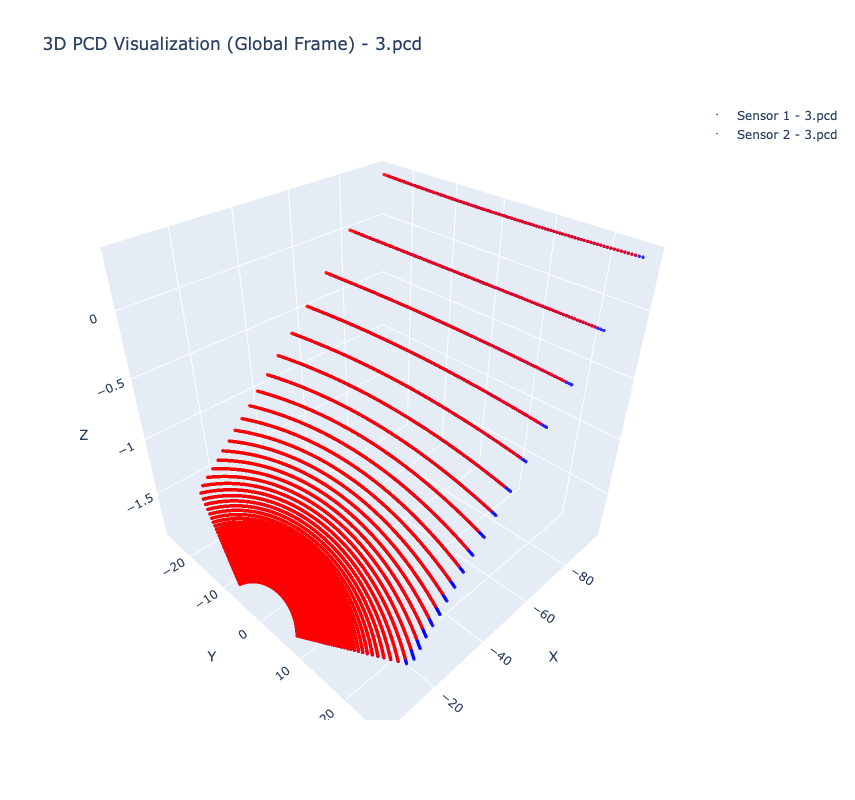

All PCD files have been visualized in global space!


In [49]:
import open3d as o3d
import numpy as np
import time
import plotly.graph_objects as go
import os
import yaml
from IPython.display import display, clear_output
from transformPCDs import compute_global_transform  # Import transformation function

# Path to config file & data folders
config_file_path = "../config/config_cube.yaml"  # Replace with actual path
data_path = "../cube_data"  # Replace with actual path

# Read YAML configuration
with open(config_file_path, 'r') as file:
    config_data = yaml.safe_load(file)

transform_sensor_1 = config_data.get("transform_sensor_1", "")[0]
transform_sensor_2 = config_data.get("transform_sensor_2", "")[0]
min_bound = config_data.get("min_bound", "")[0]
max_bound = config_data.get("max_bound", "")[0]
number_of_sensors = config_data.get("number_of_sensors", "")

# Define sensor paths
sensors = [data_path + "/sensor_" + str(i+1) + "/" for i in range(number_of_sensors)]

# Get sorted PCD filenames (assuming both sensors have the same filenames)
pcd_files = sorted([f for f in os.listdir(sensors[0]) if f.endswith(".pcd")])

# Loop through each pair of corresponding PCD files
for file_name in pcd_files:
    clear_output(wait=True)  # Clears previous frame output in Jupyter

    fig = go.Figure()  # Create empty Plotly figure

    for sensor_idx, sensor in enumerate(sensors):
        file_path = os.path.join(sensor, file_name)
        pcd = o3d.io.read_point_cloud(file_path)  # Load PCD file

        # Apply global transformation
        if sensor_idx == 0:
            #transform_sensor_1 = T_sensor_1_to_sensor1_euler #compute_icp_transformation(sensor_2_pcd, sensor_1_pcd)
            T_g = np.linalg.inv(T_sensor_1_to_sensor1) #compute_global_transform(transform_sensor_1[3:], transform_sensor_1[:3])
        else:
            transform_sensor_2 = T_sensor_2_to_sensor1_euler
            T_g = np.linalg.inv(T_sensor_2_to_sensor1) #compute_global_transform(transform_sensor_2[3:], transform_sensor_2[:3])

        print(f"Transformation matrix for Sensor {sensor_idx + 1}:\n", T_g)
        # compute_icp_transformation(
        pcd.transform(T_g)  # Transform PCD to global space

        # Crop region of interest
        roi = o3d.geometry.AxisAlignedBoundingBox(min_bound, max_bound)
        # pcd = pcd.crop(roi)

        # Convert to NumPy array
        points = np.asarray(pcd.points)

        # Assign colors: first sensor (blue), second sensor (red)
        color = 'blue' if sensor_idx == 0 else 'red'

        # Add transformed point cloud to Plotly scatter plot
        fig.add_trace(go.Scatter3d(
            x=points[:, 0], 
            y=points[:, 1], 
            z=points[:, 2],
            mode='markers',
            marker=dict(size=2, color=color, opacity=0.8),
            name=f"Sensor {sensor_idx + 1} - {file_name}"
        ))

    # Update layout
    fig.update_layout(
        title=f"3D PCD Visualization (Global Frame) - {file_name}",
        scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'),
        width=800, height=800
    )

    display(fig)  # Show the updated figure
    time.sleep(3)  # Adjust delay as needed

    # break
    
print("All PCD files have been visualized in global space!")

In [42]:
import open3d as o3d
import numpy as np

def compute_icp_transformation(source_pcd, target_pcd, threshold=0.02):
    """
    Computes the transformation matrix using ICP (Iterative Closest Point) registration.

    Parameters:
    - source_pcd: Open3D point cloud (PCD file from the sensor)
    - target_pcd: Open3D point cloud (Reference global frame PCD)
    - threshold: Distance threshold for ICP (increase if clouds are far apart)

    Returns:
    - 4x4 transformation matrix (numpy array)
    """
    # Estimate normals (optional, but improves alignment)
    source_pcd.estimate_normals()
    target_pcd.estimate_normals()

    # Perform ICP registration
    icp_result = o3d.pipelines.registration.registration_icp(
        source_pcd, target_pcd, threshold, np.eye(4),
        o3d.pipelines.registration.TransformationEstimationPointToPoint()
    )

    return icp_result.transformation  # Return the estimated transformation matri

In [32]:
# Load two point clouds (one from each sensor)
sensor_1_pcd = o3d.io.read_point_cloud("../cube_data/sensor_1/1.pcd")
sensor_2_pcd = o3d.io.read_point_cloud("../cube_data/sensor_2/1.pcd")

# Compute transformation matrix from sensor_2 to sensor_1 (assuming sensor_1 is in global frame)
T_sensor_2_to_global = compute_icp_transformation(sensor_2_pcd, sensor_1_pcd)

# Apply transformation to sensor_2
sensor_2_pcd.transform(T_sensor_2_to_global)
print(T_sensor_2_to_global)

# Now, both point clouds are in the same coordinate system
# o3d.visualization.draw_geometries([sensor_1_pcd, sensor_2_pcd]) 

[[ 1.00000000e+00  4.93494091e-08  1.23323366e-08 -1.01643614e-06]
 [-4.93494089e-08  1.00000000e+00 -1.57968866e-08 -1.59968213e-06]
 [-1.23323374e-08  1.57968860e-08  1.00000000e+00 -4.29453922e-07]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [39]:
sensor_1_pcd = o3d.io.read_point_cloud("../cube_data/sensor_1/2.pcd")
sensor_2_pcd = o3d.io.read_point_cloud("../cube_data/sensor_2/2.pcd")

# Compute transformation matrix from sensor_2 to sensor_1 (assuming sensor_1 is in global frame)
T_sensor_1_to_sensor1 = compute_icp_transformation(sensor_1_pcd, sensor_1_pcd)
T_sensor_2_to_sensor1 = compute_icp_transformation(sensor_2_pcd, sensor_1_pcd)

print(T_sensor_1_to_sensor1)
print(T_sensor_2_to_sensor1)
# Apply transformation to sensor_2
# sensor_2_pcd.transform(T_sensor_2_to_global)
# print(T_sensor_2_to_global)
from transformPCDs import homogeneous_to_euler
T_sensor_1_to_sensor1_euler = homogeneous_to_euler(T_sensor_1_to_sensor1)
T_sensor_2_to_sensor1_euler = homogeneous_to_euler(T_sensor_2_to_sensor1)
print(T_sensor_1_to_sensor1_euler)
print(T_sensor_2_to_sensor1_euler)

[[ 1.00000000e+00 -2.84673542e-18 -7.37919387e-18  3.55271368e-15]
 [-2.85188590e-18  1.00000000e+00 -2.06964758e-19 -4.16333634e-17]
 [-7.37919387e-18  2.26654932e-19  1.00000000e+00 -2.22044605e-16]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[[ 1.00000000e+00  4.93494091e-08  1.23323366e-08 -1.01643614e-06]
 [-4.93494089e-08  1.00000000e+00 -1.57968866e-08 -1.59968213e-06]
 [-1.23323374e-08  1.57968860e-08  1.00000000e+00 -4.29453921e-07]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[ 2.26654932e-19  7.37919387e-18 -2.85188590e-18]
[ 1.57968860e-08  1.23323374e-08 -4.93494089e-08]
